In [1]:
from __future__ import division, print_function

import datetime

import os
import sys
from collections import OrderedDict
import cPickle as pickle
import numpy as np
from scipy import special

from astropy import units as u


from astropy import constants as cnst
from astropy.coordinates import SkyCoord
from astropy.modeling import models
from astropy.io import fits, ascii
from astropy.table import Table

import emceemr
from emceemr import priors
import pyds9

In [2]:
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import rcParams
from matplotlib import patches

rcParams['figure.figsize'] = (16, 10)
rcParams['image.interpolation'] = 'none'
rcParams['image.origin'] = 'lower'

# Definitions

In [4]:
def read_data(objnm, filtnm, suffix='_err'):
    fntempl = 'drizzled_{objnm}_{filtnm}{suffix}/{objnm}_{filtnm}{suffix}_drc_{ftype}.fits'
    
    ftype = '<whatever>'
    print('Loading data from', fntempl.format(**locals()))
    
    ftype = 'sci'
    fn = fntempl.format(**locals())
    scif = fits.open(fn)
    tab = scif[1]
    sciim = scif[0]
    sciim.header['FILENAME'] = fn
    ftype = 'wht'
    fn = fntempl.format(**locals())
    whtim = fits.open(fn)[0]
    whtim.header['FILENAME'] = fn
    ftype = 'ctx'
    fn = fntempl.format(**locals())
    ctxim = fits.open(fn)[0]
    ctxim.header['FILENAME'] = fn
    
    return sciim, whtim, ctxim, tab

def view_in_ds9(ims, frames=1, ds9obj=None, usefileifpossible=True):
    if ds9obj is None:
        ds9obj = pyds9.DS9()
        
    if getattr(frames, 'shape', None) == tuple() or np.isscalar(frames):
        frames = np.arange(len(ims)) + frames
    if len(frames) != len(ims):
        raise ValueError('len of frames != ims')
        
    for im, frnum in zip(ims, frames):
        ds9obj.set('frame {0}'.format(frnum))
        
        if hasattr(im, 'header') and 'FILENAME' in im.header:
            ds9obj.set('file "{0}"'.format(os.path.abspath(im.header['FILENAME'])))
        else:
            if hasattr(im, 'dtype'):
                ds9obj.set_np2arr(im)
            else:
                ds9obj.set_np2arr(im.data)
        
    return ds9obj

def draw_point_and_aperture(cen, radius, ds9obj=None, clearreg=True, frame=None):
    if ds9obj is None:
        ds9obj = pyds9.DS9()
    if frame is not None:
        ds9obj.set('frame {0}'.format(frame))
    if clearreg:
        ds9obj.set('regions delete all')
    ds9obj.set('regions', 'circle {x} {y} {radius} # color=red'.format(x=cen[0], y=cen[1], radius=radius))
    ds9obj.set('regions', 'point {x} {y} # point=x color=red'.format(x=cen[0], y=cen[1]))
    

In [5]:
TWOPI = 2*np.pi
class SersicModel(emceemr.Model):
    param_names = 'flux, n, reffmaj, ellipticity, cenx, ceny, theta'.split(', ')
    def __init__(self, xg, yg, dat, ivar, priors):
        self.xg = xg
        self.yg = yg
        self.dat = dat
        self.ivar = ivar
        self.infiniteivar = ~np.isfinite(self.ivar)
        
        super(SersicModel, self).__init__(priors)
    
    def lnprob(self, flux, n, reffmaj, ellipticity, cenx, ceny, theta):
        mod = self.get_model(flux, n, reffmaj, ellipticity, cenx, ceny, theta)
        ddat = self.dat-mod
        res = -0.5*(self.ivar*ddat*ddat)#+ np.log(TWOPI*self.ivar))  #just a constant
        res[self.infiniteivar] = 0
        return res
    
    def get_model(self, flux, n, reffmaj, ellipticity, cenx, ceny, theta):
        dx = self.xg - cenx
        dy = self.yg - ceny
        if theta != 0:
            thrad = np.radians(theta)
            rotmat = [[np.cos(thrad), -np.sin(thrad)],
                      [np.sin(thrad), np.cos(thrad)]]
            dxy = np.array([dx, dy], copy=False)
            dx, dy = np.dot(rotmat, dxy.reshape(2,-1)).reshape(dxy.shape)
            
        reffmin = reffmaj*(1 - ellipticity)
        #rreff = np.hypot(dx/reffmin, dy/reffmaj)
        dx = dx/reffmin
        dy = dy/reffmaj
        rreff = np.sqrt(dx*dx + dy*dy)
        
        bn = self.bn(n)
        ebn = np.exp(bn)
        # normalize to make the integral over the areal profile to infinity = 1
        N = bn**(2*n)/ (TWOPI*reffmaj*reffmin * n * special.gamma(2*n)) 
        return flux * N * np.exp(-bn*rreff**(1/n))
    
        #more expressive way:
        #N = TWOPI*reffmaj*reffmin * n * special.gamma(2*n) * ebn * bn**(-2*n)
        #return flux * np.exp(-bn*(rreff**(1/n)-1)) / N
    
    @staticmethod
    def bn(n):
        return special.gammaincinv(2*n, 0.5)

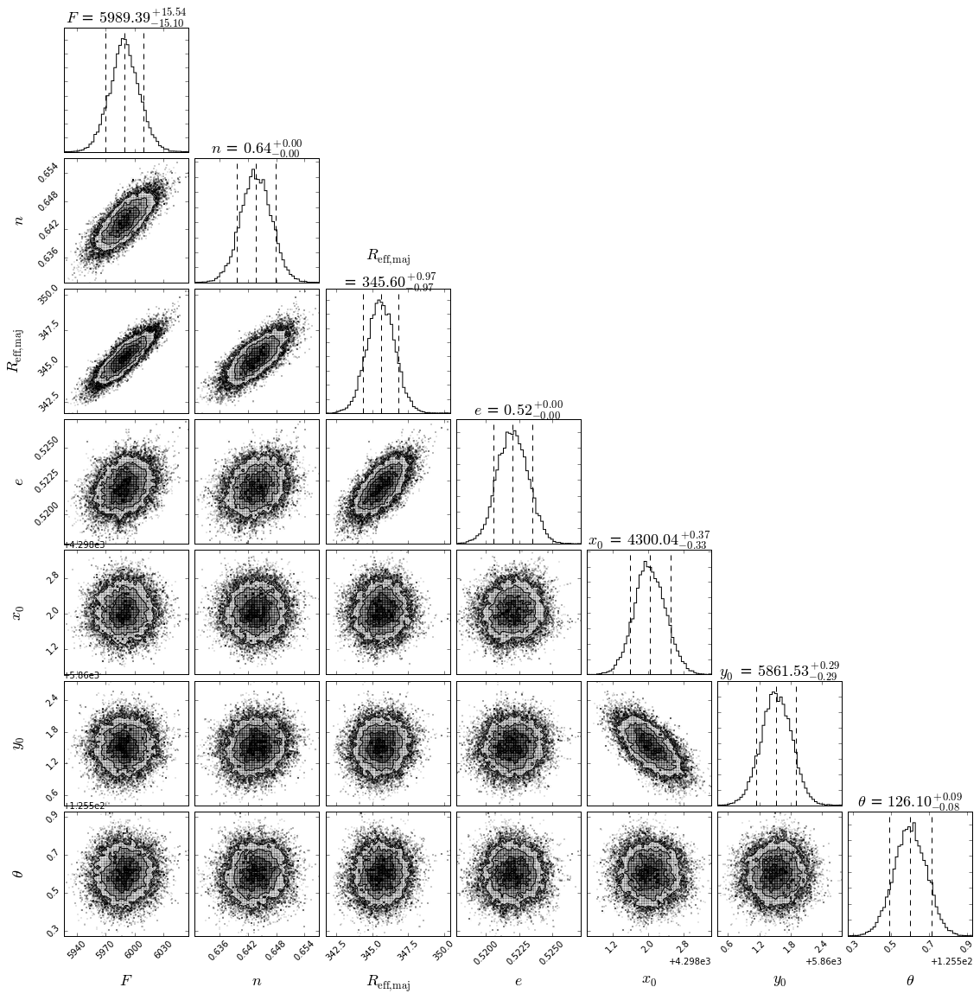

In [48]:
def save_pub_figure(basename, figdir='figures', fig=None):
    import os
    if fig is None:
        fig = plt.gcf()
    plt.savefig(os.path.join(figdir, basename+'.pdf'))
    plt.savefig(os.path.join(figdir, basename+'.png'))
    
def reprocess_triangle_for_pub(fig):
    
    for ax in fig.axes:
        for txt in (ax.title, ax.xaxis.label, ax.yaxis.label):
            #boost the sizes of the labels
            txt.set_fontsize(18)
            
            #strip out newlines unless they are before '='s
            if '=' not in txt.get_text():
                txt.set_text(txt.get_text().replace('\n', ''))
                
struct_param_relabels={'flux':r'$F$',
                       'n':r'$n$',
                       'reffmaj':r'$R_{\rm eff,maj}$' + '\n',
                       'ellipticity':r'$e$',
                       'cenx':r'$x_0$',
                       'ceny':r'$y_0$',
                       'theta':r'$\theta$'}

# Pisc B

In [6]:
f606w_b_sci, f606w_b_wht, f606w_b_ctx, f606w_b_tab = read_data('PiscB', 'F606W')
f814w_b_sci, f814w_b_wht, f814w_b_ctx, f814w_b_tab = read_data('PiscB', 'F814W')

Loading data from drizzled_PiscB_F606W_err/PiscB_F606W_err_drc_<whatever>.fits
Loading data from drizzled_PiscB_F814W_err/PiscB_F814W_err_drc_<whatever>.fits


In [7]:
centerB = [5870, 4285]
ds9obj = view_in_ds9([f606w_b_sci, f606w_b_wht],frames=1)
draw_point_and_aperture(centerB[::-1], 440, frame=1)

In [8]:
#regions to mask as output via print(ds9obj.get('regions'))
mask_regions="""
# Region file format: DS9 version 4.1
global color=green dashlist=8 3 width=1 font="helvetica 10 normal roman" select=1 highlite=1 dash=0 fixed=0 edit=1 move=1 delete=1 include=1 source=1
physical
ellipse(4070.5333,5412.9606,98.411495,59.134379,320)
ellipse(4574.0206,5473.1339,35.747189,67.900701,340)
ellipse(3528.5806,5751.3418,66.569336,44.457201,340)
circle(4009.5175,5233.7022,147.38474)
box(3990.8551,5183.9358,20.736,775.52639,0)
box(4018.8487,5232.6654,678.06719,31.104,0)
box(3452.7559,6068.3262,22.8096,657.33119,344)
box(3778.3111,5711.667,18.6624,201.1392,352)
box(4691.7607,5470.1502,93.599999,23.04,0)
"""

# estimated ellipse region for "most" of the light
obj_region='ellipse(4172.1799,5939.5902,276.81788,573.53966,55)'

#estimated boxes with "most" of the light
obj_box_regions="""
box(4428.2695,5830.7262,491.4432,582.68159,0)
box(3985.5559,5953.0686,584.75519,595.12319,0)
"""

### F606W

5585.3955

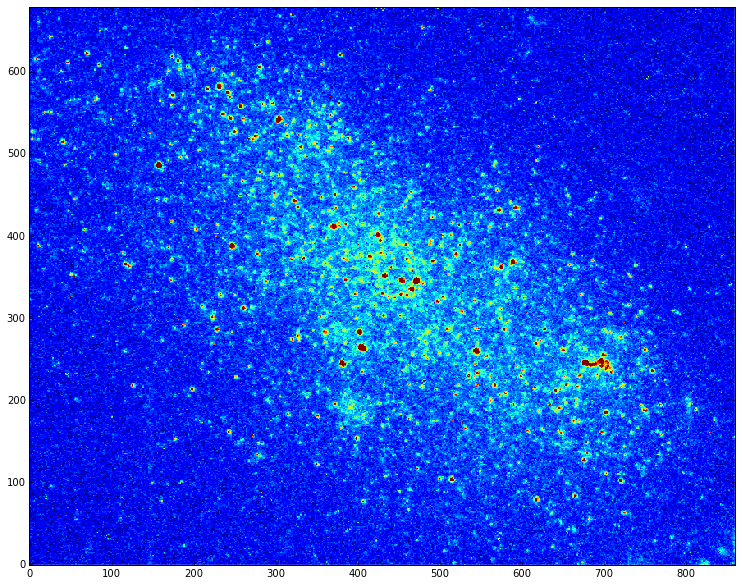

In [9]:
f606w_b_xg, f606w_b_yg = np.meshgrid(np.arange(f606w_b_sci.shape[0]), np.arange(f606w_b_sci.shape[1]))
mskB = (slice(centerB[0]-340, centerB[0]+340), 
       slice(centerB[1]-440, centerB[1]+420))
f606w_b_sci_slc = f606w_b_sci.data[mskB]
f606w_b_wht_slc = f606w_b_wht.data[mskB]

plt.imshow(f606w_b_sci_slc,vmin=-.01,vmax=.1)
np.sum(f606w_b_sci_slc.ravel()*(f606w_b_wht_slc.ravel()!=0))

In [10]:
priors606b = dict(flux=priors.NormalPrior(5800,1000,lower=1000,upper=10000), 
              n=priors.UniformPrior(0.2,1.5),
              reffmaj=priors.UniformPrior(150,800),
              ellipticity=priors.UniformPrior(0.25, 0.75),
              cenx=priors.UniformPrior(centerB[1]-50, centerB[1]+50),
              ceny=priors.UniformPrior(centerB[0]-50, centerB[0]+50),
              theta=priors.UniformPrior(90, 180))

mod606b = SersicModel(f606w_b_xg[mskB], f606w_b_yg[mskB],
                  f606w_b_sci_slc, ivar=f606w_b_wht_slc, 
                  priors=priors606b)
sampler606b = mod606b.initialize_and_sample(2000, burnin=1000)

print(emceemr.sampler_info_string(mod606b, sampler606b))

Acors:
flux: 63.078894283
n: 66.1956615118
reffmaj: 68.7149388749
ellipticity: 67.2085408242
cenx: 54.3177016302
ceny: 45.4862724932
theta: 57.8747805729
Acceptance Fractions:
[ 0.4895,  0.4945,  0.4785,  0.486 ,  0.5045,  0.466 ,  0.468 ,  0.4735,
  0.4715,  0.503 ,  0.4865,  0.487 ,  0.4955,  0.4865,  0.4615,  0.498 ,
  0.4925,  0.4845,  0.4905,  0.503 ,  0.4765,  0.481 ,  0.4665,  0.477 ,
  0.4825,  0.5025,  0.4955,  0.4905]


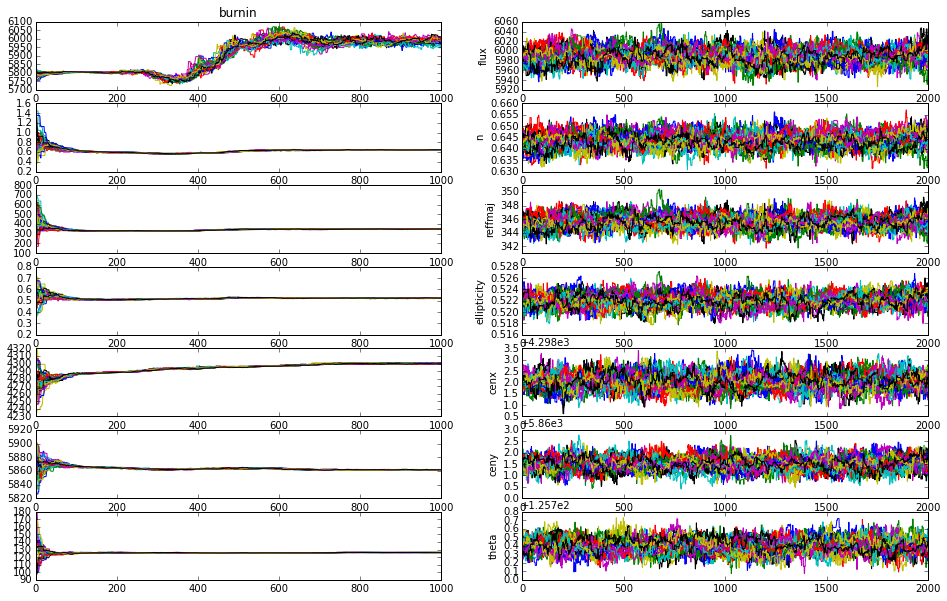

In [31]:
emceemr.plot_chains(mod606b, sampler606b)

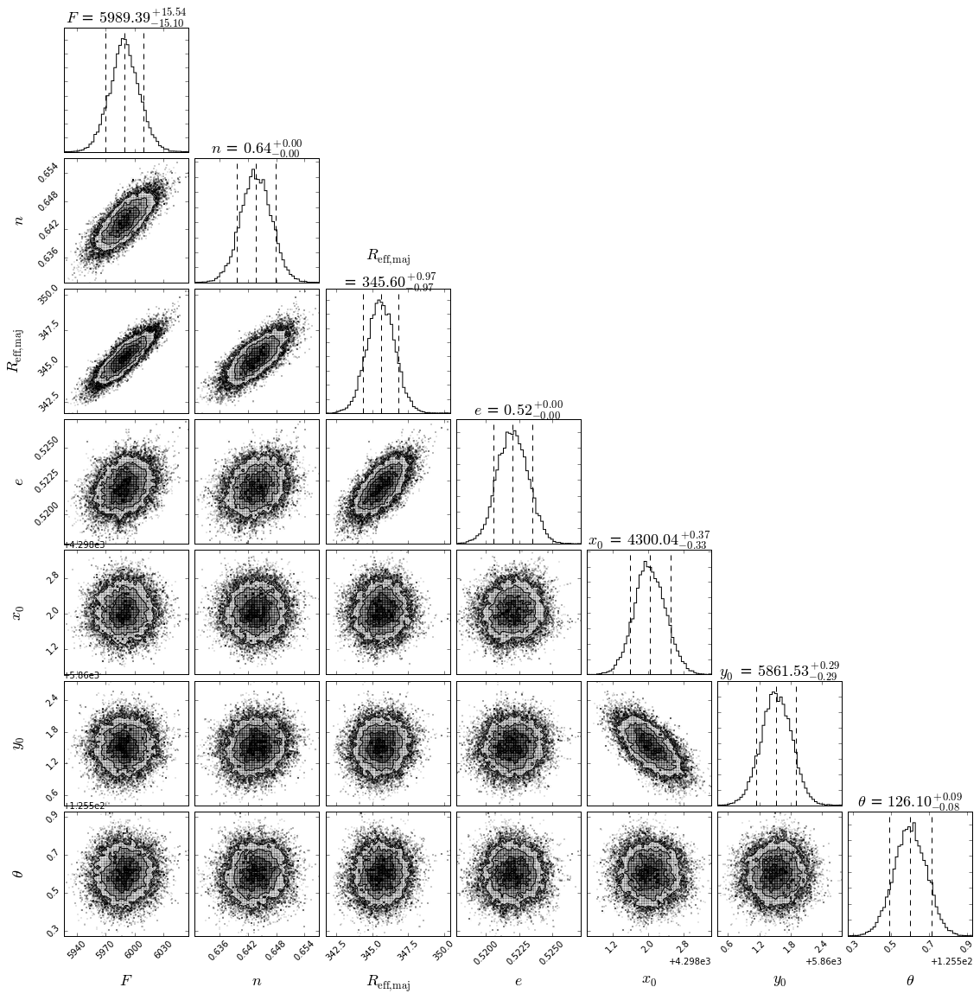

In [49]:
emceemr.triangle_plot(mod606b, sampler606b, quantiles=[.1,.5,.9], show_titles=True,
                      relabel=struct_param_relabels, verbose=False)
reprocess_triangle_for_pub(plt.gcf())
save_pub_figure('struc_params_B')

OrderedDict([('flux', 5989.3877419049841), ('n', 0.64369906198328419), ('reffmaj', 345.59843659212504), ('ellipticity', 0.52202290435262766), ('cenx', 4300.037266864284), ('ceny', 5861.5261493156167), ('theta', 126.10133486882714)])


<matplotlib.colorbar.Colorbar instance at 0x168377dd0>

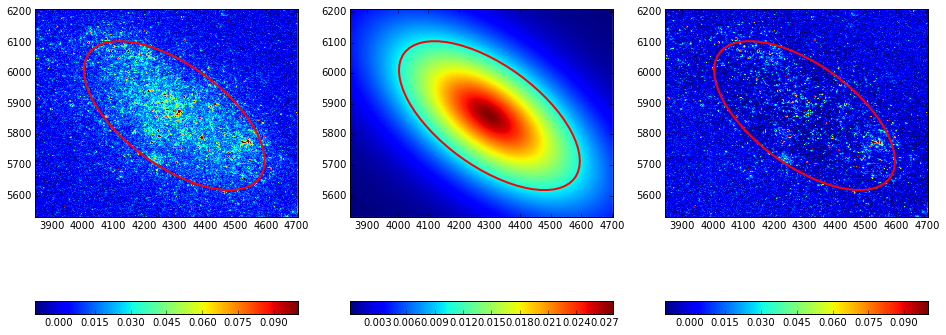

In [12]:
modparams = np.percentile(sampler606b.flatchain, 50, axis=0)
print(OrderedDict(zip(mod606b.param_names, modparams)))

ellargs = [(modparams[-3], modparams[-2]), 2*modparams[2], 2*modparams[2]*(1 - modparams[3])]
ellkwargs = dict(angle=90 - modparams[-1], facecolor='none', lw=2, edgecolor='r')

plt.subplot(1,3,1).add_patch(patches.Ellipse(*ellargs, **ellkwargs))
plt.imshow(f606w_b_sci_slc, vmin=-.01,vmax=.1, 
           extent=(np.min(mod606b.xg), np.max(mod606b.xg), np.min(mod606b.yg), np.max(mod606b.yg)))
plt.colorbar(orientation='horizontal')
plt.subplot(1,3,2).add_patch(patches.Ellipse(*ellargs, **ellkwargs))
plt.imshow(mod606b.get_model(*modparams),# vmin=-.01,vmax=.1, 
           extent=(np.min(mod606b.xg), np.max(mod606b.xg), np.min(mod606b.yg), np.max(mod606b.yg)))
plt.colorbar(orientation='horizontal')
plt.subplot(1,3,3).add_patch(patches.Ellipse(*ellargs, **ellkwargs))
plt.imshow(f606w_b_sci_slc-mod606b.get_model(*modparams), vmin=-.01,vmax=.1,
           extent=(np.min(mod606b.xg), np.max(mod606b.xg), np.min(mod606b.yg), np.max(mod606b.yg)))
plt.colorbar(orientation='horizontal')

### F814W

3926.5918

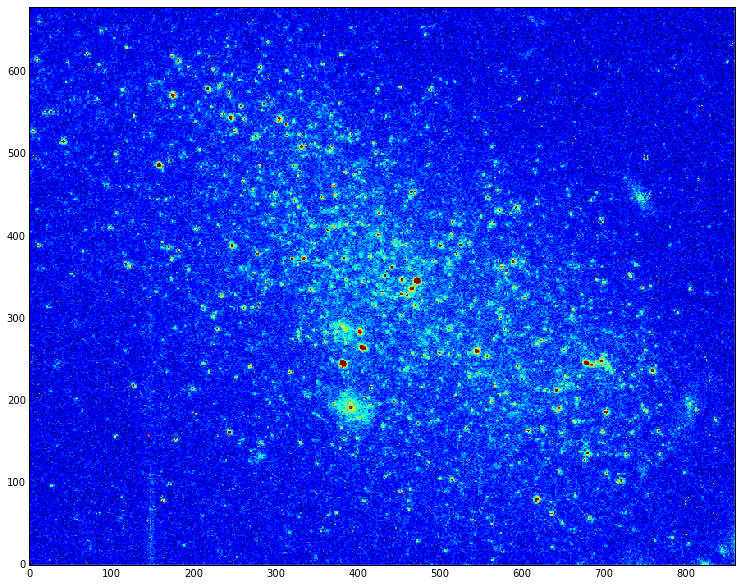

In [13]:
f814w_b_xg, f814w_b_yg = np.meshgrid(np.arange(f814w_b_sci.shape[0]), np.arange(f814w_b_sci.shape[1]))
f814w_b_sci_slc = f814w_b_sci.data[mskB]
f814w_b_wht_slc = f814w_b_wht.data[mskB]

plt.imshow(f814w_b_sci_slc,vmin=-.01,vmax=.1)
np.sum(f814w_b_sci_slc.ravel()*(f814w_b_wht_slc.ravel()!=0))

Acors:
flux: 67.9905313114
n: 45.4427161963
reffmaj: 76.4434629747
ellipticity: 80.4145926367
cenx: 78.346275944
ceny: 67.4875662832
theta: 48.1474668518
Acceptance Fractions:
[ 0.4885,  0.4855,  0.497 ,  0.469 ,  0.4605,  0.4715,  0.5   ,  0.491 ,
  0.493 ,  0.491 ,  0.487 ,  0.481 ,  0.4665,  0.4755,  0.4785,  0.4805,
  0.479 ,  0.498 ,  0.505 ,  0.4955,  0.4875,  0.498 ,  0.495 ,  0.4895,
  0.4715,  0.4985,  0.4965,  0.4875]


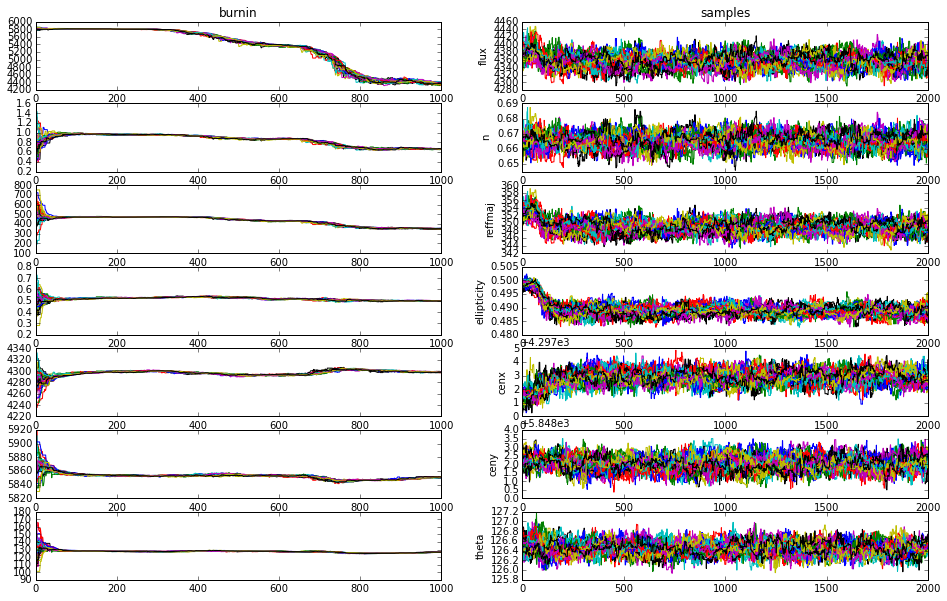

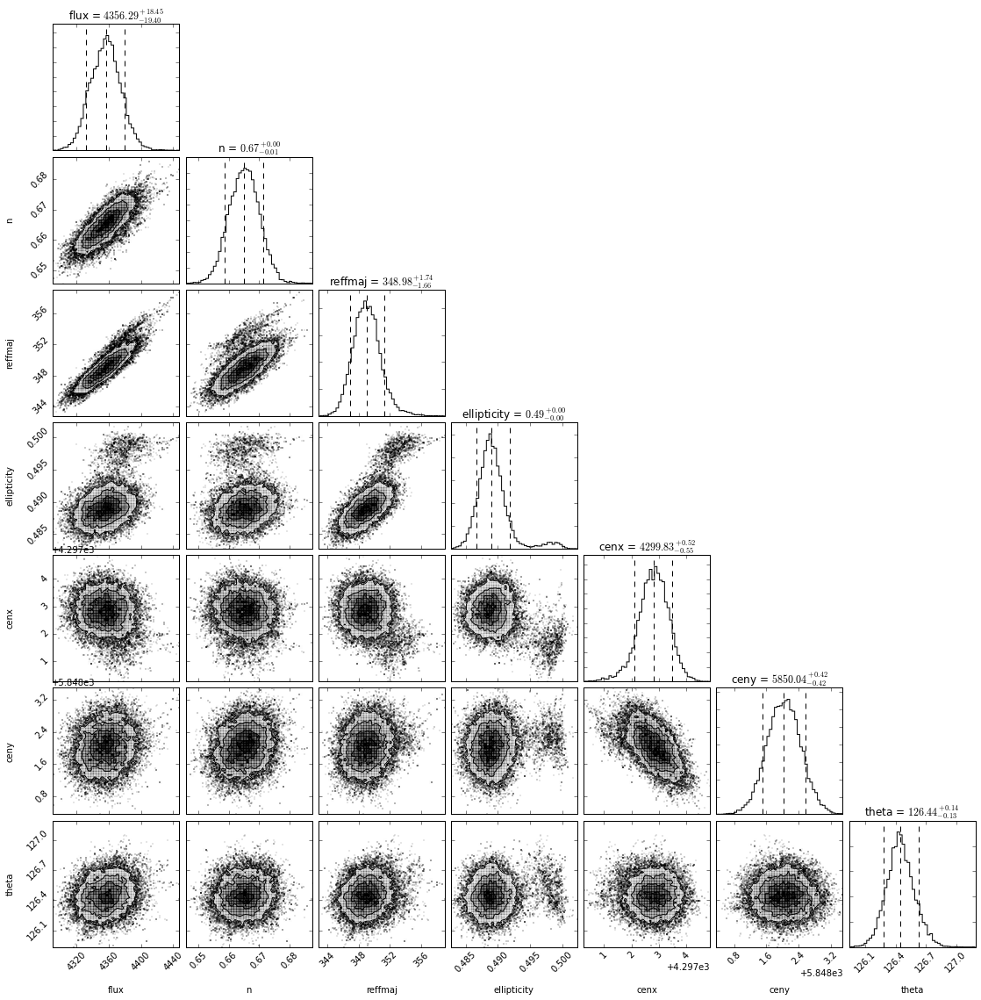

In [14]:
priors814b = dict(flux=priors.NormalPrior(5800,1000,lower=1000,upper=10000), 
              n=priors.UniformPrior(0.2,1.5),
              reffmaj=priors.UniformPrior(150,800),
              ellipticity=priors.UniformPrior(0.25, 0.75),
              cenx=priors.UniformPrior(centerB[1]-50, centerB[1]+50),
              ceny=priors.UniformPrior(centerB[0]-50, centerB[0]+50),
              theta=priors.UniformPrior(90, 180))

mod814b = SersicModel(f814w_b_xg[mskB], f814w_b_yg[mskB],
                  f814w_b_sci_slc, ivar=f814w_b_wht_slc, 
                  priors=priors814b)
sampler814b = mod814b.initialize_and_sample(2000, burnin=1000)

plt.figure()
emceemr.plot_chains(mod814b, sampler814b)
plt.figure()
emceemr.triangle_plot(mod814b, sampler814b, quantiles=[.1,.5,.9], show_titles=True, verbose=False)


print(emceemr.sampler_info_string(mod814b, sampler814b))

OrderedDict([('flux', 4356.2933743194699), ('n', 0.66510822075755693), ('reffmaj', 348.97609229086152), ('ellipticity', 0.48897673846336909), ('cenx', 4299.8262092621499), ('ceny', 5850.0371553747773), ('theta', 126.44295156584012)])


<matplotlib.colorbar.Colorbar instance at 0x16694d4d0>

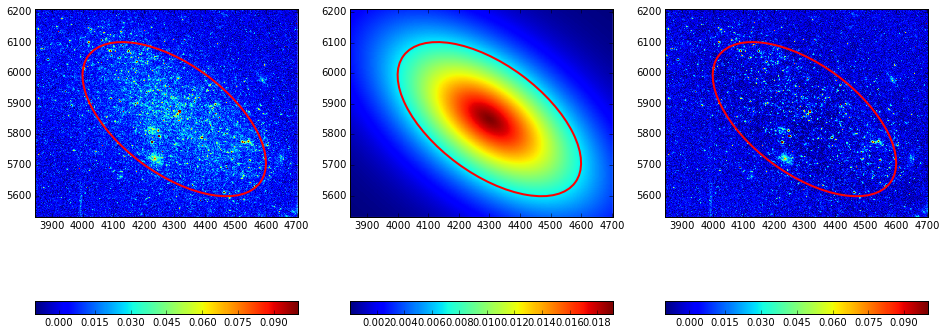

In [15]:
modparams = np.percentile(sampler814b.flatchain, 50, axis=0)
print(OrderedDict(zip(mod814b.param_names, modparams)))


ellargs = [(modparams[-3], modparams[-2]), 2*modparams[2], 2*modparams[2]*(1 - modparams[3])]
ellkwargs = dict(angle=90 - modparams[-1], facecolor='none', lw=2, edgecolor='r')

plt.subplot(1,3,1).add_patch(patches.Ellipse(*ellargs, **ellkwargs))
plt.imshow(f814w_b_sci_slc, vmin=-.01,vmax=.1, 
           extent=(np.min(mod814b.xg), np.max(mod814b.xg), np.min(mod814b.yg), np.max(mod814b.yg)))
plt.colorbar(orientation='horizontal')
plt.subplot(1,3,2).add_patch(patches.Ellipse(*ellargs, **ellkwargs))
plt.imshow(mod814b.get_model(*modparams),# vmin=-.01,vmax=.1, 
           extent=(np.min(mod814b.xg), np.max(mod814b.xg), np.min(mod814b.yg), np.max(mod814b.yg)))
plt.colorbar(orientation='horizontal')
plt.subplot(1,3,3).add_patch(patches.Ellipse(*ellargs, **ellkwargs))
plt.imshow(f814w_b_sci_slc-mod814b.get_model(*modparams), vmin=-.01,vmax=.1,
           extent=(np.min(mod814b.xg), np.max(mod814b.xg), np.min(mod814b.yg), np.max(mod814b.yg)))
plt.colorbar(orientation='horizontal')

# Pisc A

In [16]:
f606w_a_sci, f606w_a_wht, f606w_a_ctx, f606w_a_tab = read_data('PiscA', 'F606W')
f814w_a_sci, f814w_a_wht, f814w_a_ctx, f814w_a_tab = read_data('PiscA', 'F814W')

Loading data from drizzled_PiscA_F606W_err/PiscA_F606W_err_drc_<whatever>.fits
Loading data from drizzled_PiscA_F814W_err/PiscA_F814W_err_drc_<whatever>.fits


In [17]:
centerA = [5400, 3650]

ds9obj = view_in_ds9([f606w_a_sci, f814w_a_sci, f814w_a_wht, f606w_a_wht],frames=1)
draw_point_and_aperture(centerA[::-1], 600, frame=1)
ds9obj.set('pan to {1} {0} image'.format(*centerA))
ds9obj.set('frame match image')

1

## F606W

5444.6899

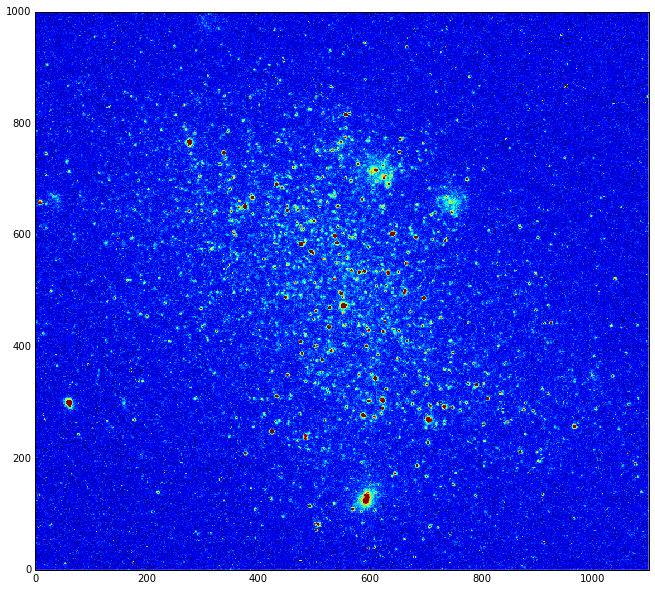

In [18]:
f606w_a_xg, f606w_a_yg = np.meshgrid(np.arange(f606w_a_sci.shape[0]), np.arange(f606w_a_sci.shape[1]))
mskA = (slice(centerA[0]-500, centerA[0]+500), 
        slice(centerA[1]-550, centerA[1]+550))
f606w_a_sci_slc = f606w_a_sci.data[mskA]
f606w_a_wht_slc = f606w_a_wht.data[mskA]

plt.imshow(f606w_a_sci_slc,vmin=-.01,vmax=.1)
np.sum(f606w_a_sci_slc.ravel()*(f606w_a_wht_slc.ravel()!=0))

In [19]:
priors606a = dict(flux=priors.NormalPrior(4000,800,lower=1000,upper=10000), 
              n=priors.UniformPrior(0.2,1.5),
              reffmaj=priors.UniformPrior(200,1000),
              ellipticity=priors.UniformPrior(0.25, 0.75),
              cenx=priors.UniformPrior(centerA[1]-50, centerA[1]+50),
              ceny=priors.UniformPrior(centerA[0]-50, centerA[0]+50),
              theta=priors.UniformPrior(90, 180))

mod606a = SersicModel(f606w_a_xg[mskA], f606w_a_yg[mskA],
                  f606w_a_sci_slc, ivar=f606w_a_wht_slc, 
                  priors=priors606a)
sampler606a = mod606a.initialize_and_sample(2000, burnin=1000)
print(emceemr.sampler_info_string(mod606a, sampler606a))

Acors:
flux: 67.9154989865
n: 54.2896670899
reffmaj: 53.5637766231
ellipticity: 56.9411755158
cenx: 54.5159406377
ceny: 52.6398054002
theta: 35.1484550867
Acceptance Fractions:
[ 0.4855,  0.471 ,  0.4955,  0.4945,  0.4985,  0.475 ,  0.472 ,  0.49  ,
  0.46  ,  0.4545,  0.485 ,  0.483 ,  0.4685,  0.4865,  0.493 ,  0.474 ,
  0.4955,  0.482 ,  0.485 ,  0.466 ,  0.4895,  0.473 ,  0.4805,  0.467 ,
  0.4655,  0.4975,  0.474 ,  0.4705]


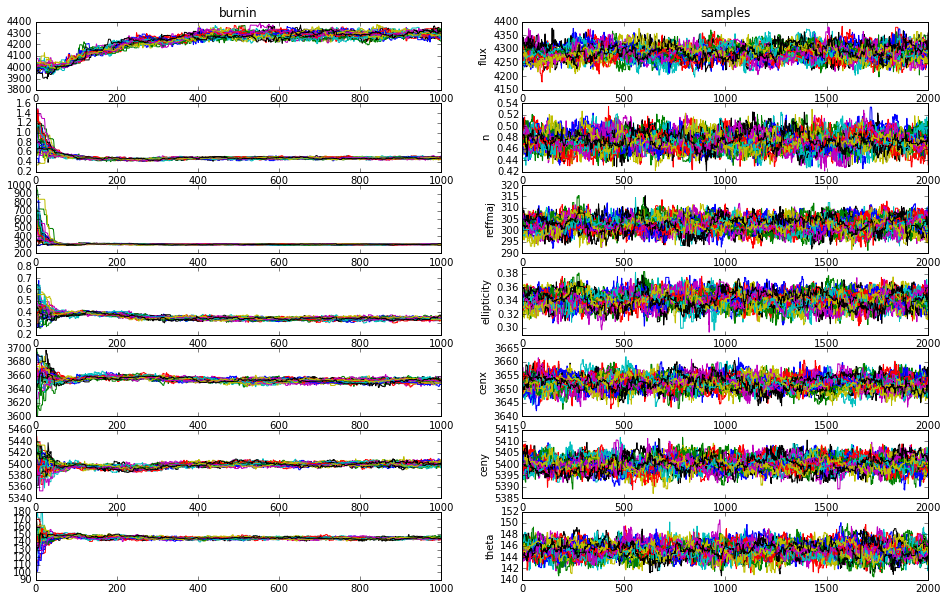

In [33]:
emceemr.plot_chains(mod606a, sampler606a)

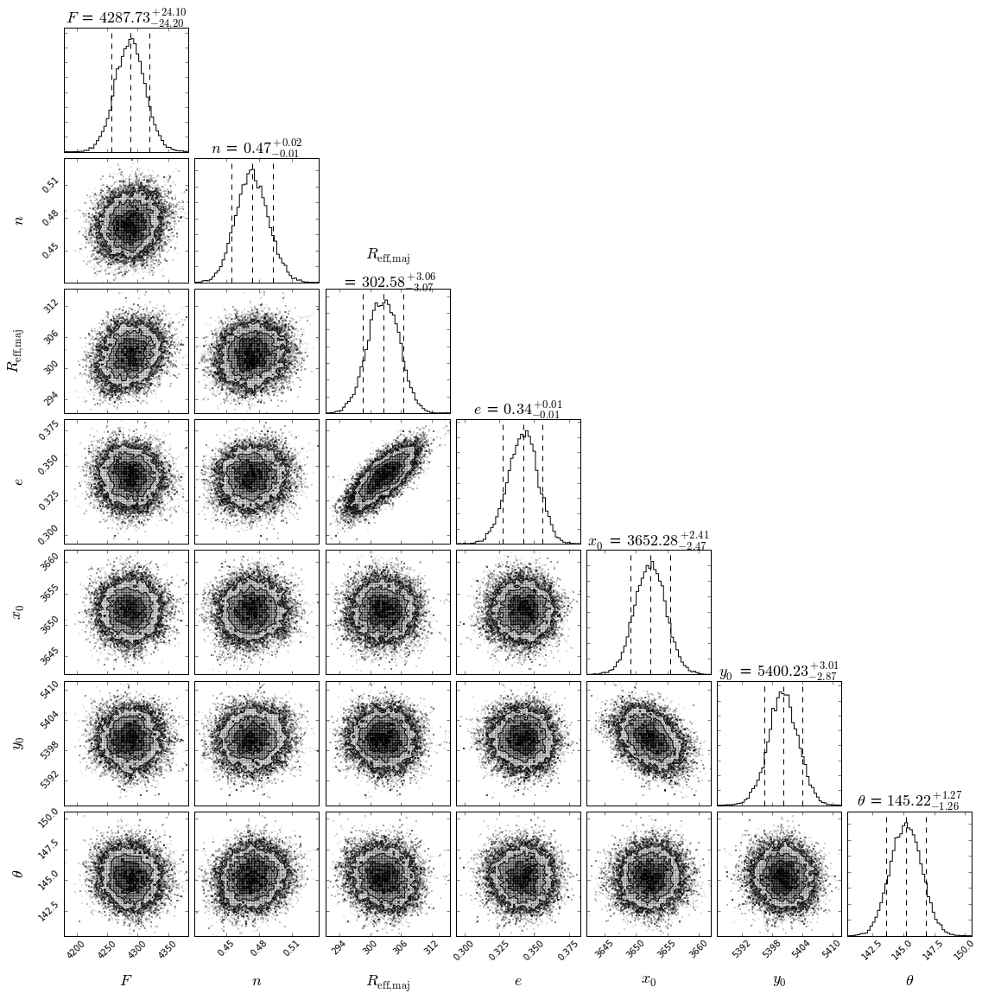

In [50]:
emceemr.triangle_plot(mod606a, sampler606a, quantiles=[.1,.5,.9], show_titles=True,
                      relabel=struct_param_relabels, verbose=False)
reprocess_triangle_for_pub(plt.gcf())
save_pub_figure('struc_params_A')

OrderedDict([('flux', 4287.7309225669887), ('n', 0.47333203719344019), ('reffmaj', 302.57622804324342), ('ellipticity', 0.34210734448858027), ('cenx', 3652.2789569793599), ('ceny', 5400.2286983581125), ('theta', 145.21612396162783)])


<matplotlib.colorbar.Colorbar instance at 0x16361e440>

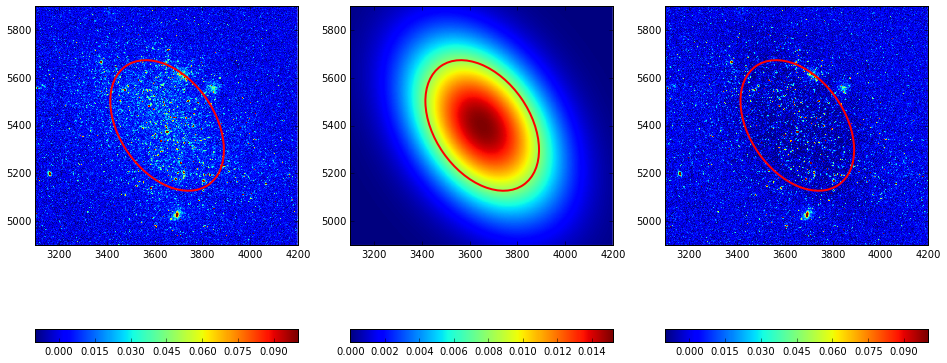

In [21]:
modparams = np.percentile(sampler606a.flatchain, 50, axis=0)
print(OrderedDict(zip(mod606a.param_names, modparams)))

ellargs = [(modparams[-3], modparams[-2]), 2*modparams[2], 2*modparams[2]*(1 - modparams[3])]
ellkwargs = dict(angle=90 - modparams[-1], facecolor='none', lw=2, edgecolor='r')

plt.subplot(1,3,1).add_patch(patches.Ellipse(*ellargs, **ellkwargs))
plt.imshow(f606w_a_sci_slc, vmin=-.01,vmax=.1, 
           extent=(np.min(mod606a.xg), np.max(mod606a.xg), np.min(mod606a.yg), np.max(mod606a.yg)))
plt.colorbar(orientation='horizontal')
plt.subplot(1,3,2).add_patch(patches.Ellipse(*ellargs, **ellkwargs))
plt.imshow(mod606a.get_model(*modparams),# vmin=-.01,vmax=.1, 
           extent=(np.min(mod606a.xg), np.max(mod606a.xg), np.min(mod606a.yg), np.max(mod606a.yg)))
plt.colorbar(orientation='horizontal')
plt.subplot(1,3,3).add_patch(patches.Ellipse(*ellargs, **ellkwargs))
plt.imshow(f606w_a_sci_slc-mod606a.get_model(*modparams), vmin=-.01,vmax=.1,
           extent=(np.min(mod606a.xg), np.max(mod606a.xg), np.min(mod606a.yg), np.max(mod606a.yg)))
plt.colorbar(orientation='horizontal')

## F814W

3717.3772

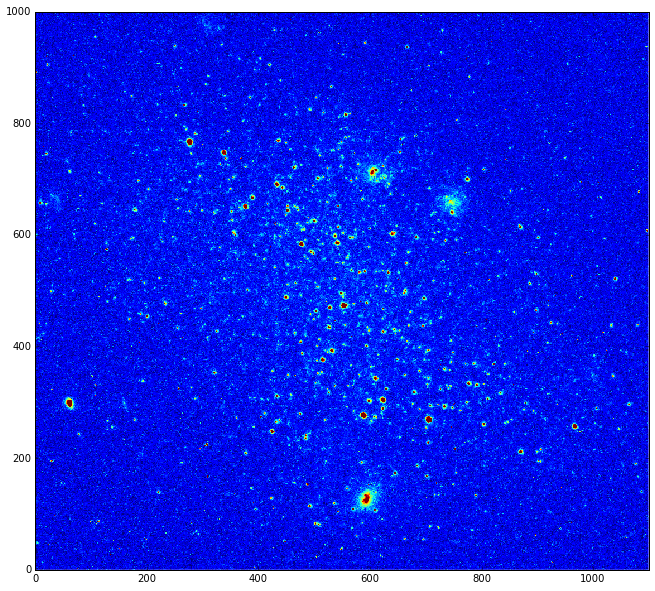

In [22]:
f814w_a_xg, f814w_a_yg = np.meshgrid(np.arange(f814w_a_sci.shape[0]), np.arange(f814w_a_sci.shape[1]))
f814w_a_sci_slc = f814w_a_sci.data[mskA]
f814w_a_wht_slc = f814w_a_wht.data[mskA]

plt.imshow(f814w_a_sci_slc,vmin=-.01,vmax=.1)
np.sum(f814w_a_sci_slc.ravel()*(f814w_a_wht_slc.ravel()!=0))

Acors:
flux: 51.3179978413
n: 43.3636668616
reffmaj: 30.6241733868
ellipticity: 45.3014540168
cenx: 53.7494322342
ceny: 45.8378323224
theta: 41.8996465819
Acceptance Fractions:
[ 0.485 ,  0.471 ,  0.4755,  0.4785,  0.492 ,  0.49  ,  0.499 ,  0.4895,
  0.5075,  0.5   ,  0.4625,  0.495 ,  0.486 ,  0.4975,  0.4825,  0.4665,
  0.4775,  0.4725,  0.4785,  0.4845,  0.475 ,  0.4815,  0.496 ,  0.4745,
  0.485 ,  0.496 ,  0.4825,  0.492 ]


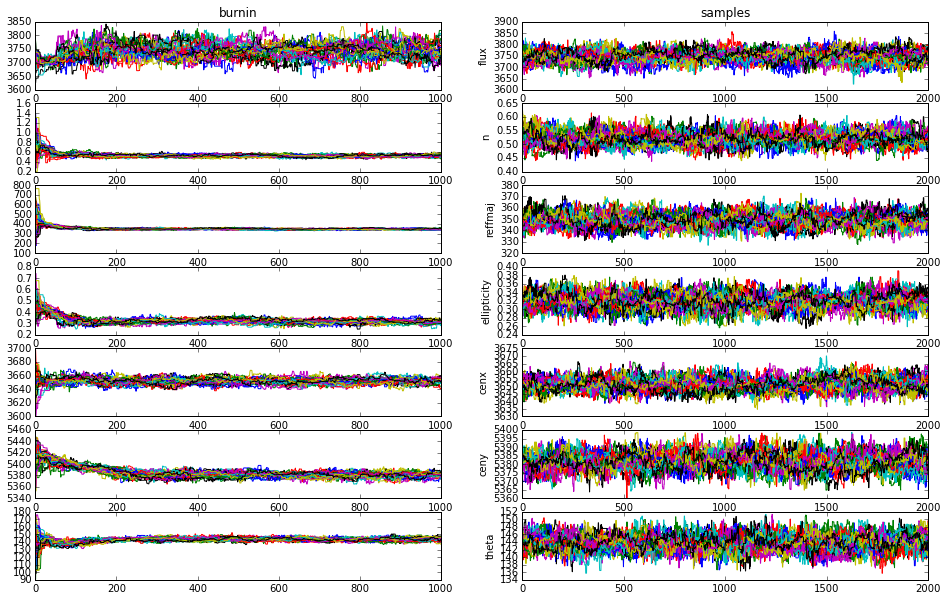

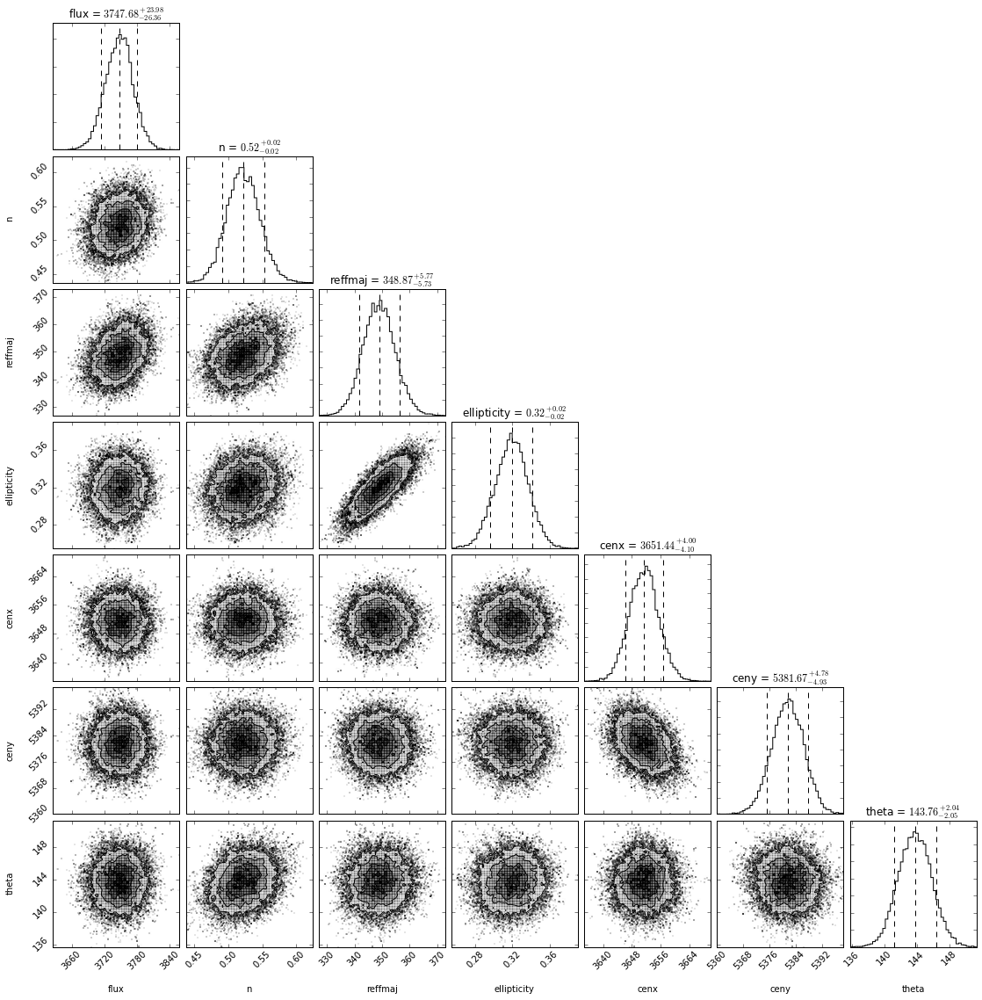

In [23]:
priors814a = dict(flux=priors.NormalPrior(3700,800,lower=1000,upper=10000), 
              n=priors.UniformPrior(0.2,1.5),
              reffmaj=priors.UniformPrior(150,800),
              ellipticity=priors.UniformPrior(0.25, 0.75),
              cenx=priors.UniformPrior(centerA[1]-50, centerA[1]+50),
              ceny=priors.UniformPrior(centerA[0]-50, centerA[0]+50),
              theta=priors.UniformPrior(90, 180))

mod814a = SersicModel(f814w_a_xg[mskA], f814w_a_yg[mskA],
                  f814w_a_sci_slc, ivar=f814w_a_wht_slc, 
                  priors=priors814a)
sampler814a = mod814a.initialize_and_sample(2000, burnin=1000)

plt.figure()
emceemr.plot_chains(mod814a, sampler814a)
plt.figure()
emceemr.triangle_plot(mod814a, sampler814a, quantiles=[.1,.5,.9], show_titles=True, verbose=False)

print(emceemr.sampler_info_string(mod814a, sampler814a))

OrderedDict([('flux', 3747.6800683858082), ('n', 0.52141783276207054), ('reffmaj', 348.87133995768818), ('ellipticity', 0.31942908765038747), ('cenx', 3651.4362384423989), ('ceny', 5381.665939104475), ('theta', 143.76242776484088)])


<matplotlib.colorbar.Colorbar instance at 0x163b6eea8>

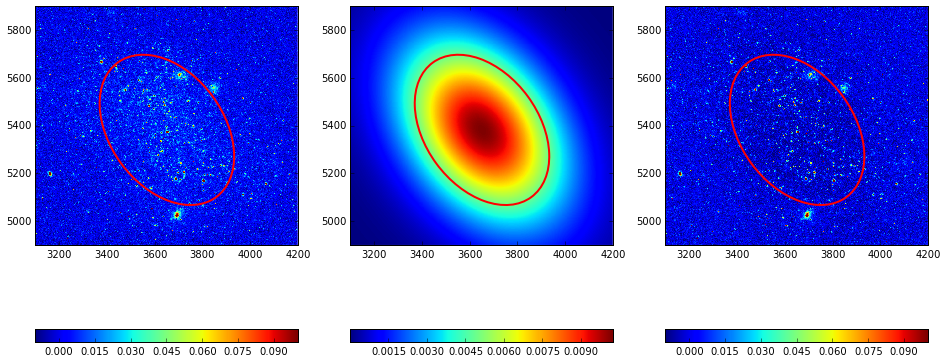

In [24]:
modparams = np.percentile(sampler814a.flatchain, 50, axis=0)
print(OrderedDict(zip(mod814a.param_names, modparams)))

ellargs = [(modparams[-3], modparams[-2]), 2*modparams[2], 2*modparams[2]*(1 - modparams[3])]
ellkwargs = dict(angle=90 - modparams[-1], facecolor='none', lw=2, edgecolor='r')

plt.subplot(1,3,1).add_patch(patches.Ellipse(*ellargs, **ellkwargs))
plt.imshow(f814w_a_sci_slc, vmin=-.01,vmax=.1, 
           extent=(np.min(mod814a.xg), np.max(mod814a.xg), np.min(mod814a.yg), np.max(mod814a.yg)))
plt.colorbar(orientation='horizontal')
plt.subplot(1,3,2).add_patch(patches.Ellipse(*ellargs, **ellkwargs))
plt.imshow(mod814a.get_model(*modparams),# vmin=-.01,vmax=.1, 
           extent=(np.min(mod814a.xg), np.max(mod814a.xg), np.min(mod814a.yg), np.max(mod814a.yg)))
plt.colorbar(orientation='horizontal')
plt.subplot(1,3,3).add_patch(patches.Ellipse(*ellargs, **ellkwargs))
plt.imshow(f814w_a_sci_slc-mod814a.get_model(*modparams), vmin=-.01,vmax=.1,
           extent=(np.min(mod814a.xg), np.max(mod814a.xg), np.min(mod814a.yg), np.max(mod814a.yg)))
plt.colorbar(orientation='horizontal')

## Saving Chains

In [25]:
datestamp = datetime.datetime.now().strftime('%Y_%m_%d')
dattodump = dict(chains814B=sampler814b.chain, 
         chains606B=sampler606b.chain,
         chains814A=sampler814a.chain,
         chains606A=sampler606a.chain,
         param_names=mod814a.param_names
         )

dattodumpwmod = dict(mod814B=mod814b,  mod606B=mod606b, mod814A=mod814a, mod606A=mod606a)
dattodumpwmod.update(dattodump)
with open('strucparams_all_{0}.pckl'.format(datestamp), 'w') as f:
    pickle.dump(dattodumpwmod, f, -1)
with open('strucparams_chains_{0}.pckl'.format(datestamp), 'w') as f:
    pickle.dump(dattodump, f, -1)

In [26]:
np.savez('strucparams_chains_{0}'.format(datestamp), 
         chains814B=sampler814b.chain, mod814B=mod814b, 
         chains606B=sampler606b.chain, mod606B=mod606b, 
         chains814A=sampler814a.chain, mod814A=mod814a, 
         chains606A=sampler606a.chain, mod606A=mod606a,
         )

In [27]:
1/0

ZeroDivisionError: division by zero

## Check clusters for Anil

In [ ]:
clustersstr="""
circle(3726.4738,5613.3183,34.601432)
circle(3850.8898,5552.8383,28.565812)
circle(3697.0978,5022.3423,28.565812)
"""[1:-1]

clusters = []
for l in  clustersstr.split('\n'):
    x0, y0, rad = l[7:-1].split(',')
    clusters.append((float(x0), float(y0), float(rad)))

In [ ]:
clusterflux606 = []
clusterflux814 = []
for i, (x0, y0, rad) in enumerate(clusters):
    plt.figure()
    dx = f606w_a_xg - y0
    dy = f606w_a_yg - x0
    dpx = np.sqrt(dx*dx+dy*dy)
    clusterflux606.append(np.sum(f606w_a_sci.data[dpx.T<=rad]))
    
    plt.scatter(dpx[dpx<=rad],f606w_a_sci.data.T[dpx<=rad], color='b', alpha=.9)
    
    dx = f814w_a_xg - y0
    dy = f814w_a_yg - x0
    dpx = np.sqrt(dx*dx+dy*dy)
    clusterflux814.append(np.sum(f814w_a_sci.data[dpx.T<=rad]))
    
    plt.scatter(dpx[dpx<=rad],f814w_a_sci.data.T[dpx<=rad], color='r', alpha=.9)
    plt.xlim(0, rad+1)
    plt.title('{0},{1},{2}'.format(x0,y0,rad))
    plt.axhline(0, c='k')

clusterflux606, clusterflux814

In [ ]:
clustermag606VEGA = -2.5*np.log10(np.array(clusterflux606))*u.mag+f606wzptVEGAMAG
clustermag814VEGA = -2.5*np.log10(np.array(clusterflux814))*u.mag+f814wzptVEGAMAG
clustermag606AB = -2.5*np.log10(np.array(clusterflux606))*u.mag+f606wzptABMAG
clustermag814AB = -2.5*np.log10(np.array(clusterflux814))*u.mag+f814wzptABMAG
clustermag606ST = -2.5*np.log10(np.array(clusterflux606))*u.mag+f606wzptSTMAG
clustermag814ST = -2.5*np.log10(np.array(clusterflux814))*u.mag+f814wzptSTMAG
print('VEGAMAG', clustermag606VEGA-clustermag814VEGA, clustermag814VEGA)
print('AB', clustermag606AB-clustermag814AB, clustermag814AB)
print('ST', clustermag606AB-clustermag814ST, clustermag814ST)

In [ ]:
clusterfluxfrac606 = np.array(clusterflux606).reshape(3,1)/sampler606a.chain[:,:,0].ravel()
clusterfluxfrac814 = np.array(clusterflux814).reshape(3,1)/sampler814a.chain[:,:,0].ravel()

for i, (cff606, cff814) in enumerate(zip(clusterfluxfrac606, clusterfluxfrac814)):
    patch = plt.hist(cff606, histtype='step', label='cluster #{0}, F606W'.format(i))[-1][0]
    plt.hist(cff814, histtype='step', label='cluster #{0}, F814W'.format(i), edgecolor=patch.get_edgecolor(), ls='dotted')
plt.hist(np.sum(clusterfluxfrac606, axis=0), histtype='step', label='F606 combined', color='k')
plt.hist(np.sum(clusterfluxfrac814, axis=0), histtype='step', label='F814 combined', color='k', ls='dotted')
plt.legend(loc=0)


# Misc info

In [ ]:
f606w_a_tab.data['DATE-OBS'], f814w_a_tab.data['DATE-OBS'], f606w_b_tab.data['DATE-OBS'], f814w_b_tab.data['DATE-OBS']

In [ ]:
#same for 2014-11-08 and 2014-10-30
zeroptinfo="""
FILTER  	  PHOTPLAM  	  PHOTFLAM  	  STmag  	  VEGAmag 	  ABmag

F606W
5921.8
7.844e-20
26.664
26.407
26.493

F814W
8059.3
7.007e-20
26.786
25.523
25.947
"""
f606wzptVEGAMAG = 26.407*u.mag
f814wzptVEGAMAG = 25.523*u.mag
f606wzptABMAG = 26.493*u.mag
f814wzptABMAG = 25.947*u.mag
f606wzptSTMAG = 26.493*u.mag
f814wzptSTMAG = 26.786*u.mag